## Simulation

#### imports

In [1]:
import graph_tool.all as gt #from Tiago Peixoto
import numpy as np
from numba import jit,njit # to do just in time compilation at machine code
from concurrent.futures import ProcessPoolExecutor  # to do multiprocessing across graphs realizations
import pickle,glob
from dataclasses import dataclass
from typing   import Dict, Any, List
import networkx as nx #to generate Watts-Strogatz faster
import time
import datetime #to print the runtime of intermediate chunks

### Auxiliary functions

In [2]:
def graph_to_csr(G):
    """
    Given an undirected graph-tool Graph G,
    returns (offs, nbrs) in CSR form, such that the neighbors of node i are nbrs[offs[i]:offs[i+1]]
    """
    degs = np.array( G.get_total_degrees(G.get_vertices()),    dtype=np.uint16)
    offs = np.r_[0, np.cumsum(degs, dtype=np.uint32)]          # (0, k_0, k_0+k_1, ... , k_0+...+k_{N-2}, k_0+...+k_{N-1})
    nbrs = np.empty(offs[-1], dtype=np.uint16)

    aux_offs = np.delete(offs,-1)
    for v in G.vertices():
        i = int(v)
        edgelist = G.get_out_edges(v)        
        targets   = edgelist[:, 1]
        
        for u in targets:
            nbrs[aux_offs[i]] = int(u)
            aux_offs[i] += 1
    
    return nbrs,offs

In [3]:
def log_schedule(start, stop, factor=1.5):
    """
    this is just to create a list of times at wich we sample the order parameter
    """
    out = [start]
    val = start
    while True:
        val = int(round(val * factor))
        if val > stop: break
        out.append(val)
    return out

### RNG

In [4]:
def bits_needed(N): #to exctract a sample in 0,N
    b = 1
    while (1 << b) < N:
        b += 1
    return b
@njit
def xorshift128p_next_float(seed_array):
    """
    In-place update of the 2-element seed_array [s0, s1] using the Xorshift128+ algorithm.
    Returns a random float64 in [0,1).
    """
    s1 = seed_array[0]
    s0 = seed_array[1]
    
    # Rotate
    seed_array[0] = s0
    
    # Xorshift steps
    s1 ^= (s1 << np.uint64(23))
    s1 ^= (s1 >> np.uint64(17))
    s1 ^= s0
    s1 ^= (s0 >> np.uint64(26))
    
    # Write back to seed_array
    seed_array[1] = s1
    
    # Output is s0 + s1
    out = s0 + s1  # still a uint64

    # Convert to float in [0,1).
    # Mask out 53 bits (the mantissa of double) for uniform distribution:
    return (out & np.uint64(0x1FFFFFFFFFFFFF)) / float(1 << 53)
@njit
def xorshift128p_next_uint(seed): #for the choiche of nodes to try to update

    """
    In‐place update of the 2‐element seed [s0, s1].
    Returns a uint64 = s0 + s1 (the next state).
    """
    s1 = seed[0]
    s0 = seed[1]
    seed[0] = s0
    # the core xorshift:
    s1 ^= (s1 << np.uint64(23))
    s1 ^= (s1 >> np.uint64(17))
    s1 ^= s0
    s1 ^= (s0 >> np.uint64(26))
    seed[1] = s1
    return s0 + s1

@njit(inline='always')
def uint64_to_unit_float(u): #for the flip trial
    # 53 random mantissa bits → float in [0,1)
    return (u & np.uint64(0x1FFFFFFFFFFFFF)) * (1.0 / (1 << 53))

@njit
def init_sigma_xorshift(N, seed):  #for the initialization of the configuration
    sigma = np.empty(N, np.int8)
    for i in range(N):
        # take the least-significant bit of a 64-bit PRNG step
        sigma[i] = 1 if (xorshift128p_next_uint(seed) & 1) else -1
    return sigma

### Dynamics

In [5]:
@njit 
def ρ(σ,E): #This is the order parameter
    count = 0
    for e in E:
        count+= (σ[e[0]] !=σ[e[1]])

    return count / len(E)

In [6]:
@njit 
def do_1_step(N, σ, seed, nn,cs_k, inv_deg, a):

    for _ in range(N):
        u = xorshift128p_next_uint(seed)    # ONE RNG call for the choiche of nodes and for the update trial
        i = int(u % N)                       # there are some avoidable correlations 
                                              # but not a tragedy for the scope of the project

        s_nb = 0
        for p in range(cs_k[i], cs_k[i+1]):
            s_nb += σ[nn[p]]  # Σ_{j ∈ nn(i)} σ_j       with csr (no slicing needed)

        p_flip = a + (1 - 2*a) * (0.5 * (1.0 - σ[i] * s_nb * inv_deg[i]))

        if p_flip == 0.0: #can be useful to speed up the non-noise part
            continue
        if p_flip == 1.0 or uint64_to_unit_float(u) < p_flip:  # use low bits for probability (see RNG)
            σ[i] = -σ[i]

In [7]:
@njit 
def do_T_steps_ρ_sample (N,σ, ρ_t, sample_times , seed, E,nn,cs_k, inv_deg, a):

    for t in range (0,sample_times[0]):  #first i sample at each timestep

        ρ_t[t] = ρ(σ,E)

        do_1_step (N,σ, seed, nn,cs_k, inv_deg, a)
    
    sample_idx = 0                       # as time passes i switch to a log sampling (see auxiliary fuction)
    for t in range (sample_times[0],sample_times[-1]+1):

        if t == sample_times[sample_idx]:
            ρ_t[sample_times[0]+sample_idx]  = ρ(σ,E)
            sample_idx+=1

        do_1_step (N,σ, seed, nn,cs_k, inv_deg, a)

@njit (fastmath=True)
def simulate_Voter_dynamics(N,E, nn,cs_k, inv_deg, num_realiz, sample_times, seed, a):

    """
    I define a single array ρ(t) and for each realization the code writes over the previous one, 
    but I keep track of the mean and variance (over realization of the dynamics) using a Welford update.
    All quantities finish with _t to signal that they are time dependent trajectories, ρ_t[t] is a number.
    """
    sample_size = sample_times[0]+len(sample_times)

    ρ_t     = np.zeros(sample_size, dtype = np.float64)
    ρ_avg_t = np.zeros(sample_size, dtype = np.float64)
    ρ_Var_t = np.zeros(sample_size, dtype = np.float64)

    for r in range (0,num_realiz):

        σ = init_sigma_xorshift(len(cs_k)-1, seed)

        do_T_steps_ρ_sample (N,σ, ρ_t, sample_times, seed, E,nn,cs_k, inv_deg, a)

        Δρ_t     = ρ_t - ρ_avg_t
        ρ_avg_t += Δρ_t / (r+1)
        ρ_Var_t  += Δρ_t * (ρ_t - ρ_avg_t ) # at the end of the loop this is num_realiz * Var
    
    ρ_Var_t = ρ_Var_t/num_realiz

    return ρ_avg_t,ρ_Var_t

### Data classes

In [8]:
@dataclass
class GraphConfig: #instanciated many times inside a particular experiment 

    N:           int
    model:       str          # “BA”, “ER”, “CM”, etc.
    params:      Dict[str,Any]   #  {"m":4}, or {"p":0.05}, or {"gamma":2.5}
    graph_seed:  int

@dataclass
class DynConfig:   #instanciated one time in main

    num_realiz:   int
    sample_times: np.ndarray
    seed0:        np.ndarray
    noise_values: list[float]        

### Graph maker

In [ ]:
from numpy.random import default_rng
from numpy.random import SeedSequence


In [10]:
def Klemm_Eguiluz_ssf(N, m, rng, a=None): # SSF stands for structured scale free 
    #undirected version of the process explained in Phys. Rev. E 65, 036123 (2002) (chapter 3)
    if a==None: a=m

    G = gt.complete_graph(m)                             # the process starts with an m-clique
    active_nodes = list(G.get_vertices())                # all starting nodes are active

    for t in range(m,N):

        G.add_vertex()                                   # a node gets added    

        new_edges = [(t, j) for j in active_nodes]       # it forms a link with the active nodes

        
        G.add_edge_list(new_edges)

        active_nodes.append(t)                           # it gets activated

        deactiv_weights = 1 / (a+G.get_total_degrees(active_nodes))
        deactiv_probs = deactiv_weights/deactiv_weights.sum()

        dactivated_node = rng.choice(active_nodes,p=deactiv_probs)   ##SEEEEEEEEEED
        active_nodes.remove(dactivated_node)             # one active node gets deactivated with some P

    return G

def cut_ring (G,N,m):  #circular network with a cut to compare with Klemm Eguiluz wich is not closed

    for i in range(m):
        for k in range(m - i):
            e = G.edge(i, N - k - 1)   
            if e is not None: G.remove_edge(e)

    return G


def make_graph(cfg,μ): #takes a GraphConfig instance and returns a Graph object
    """
    Valid models: {"BA", "SSF", "SWSF", "String", "SW", "EN", "SBM"}
    """
    gt.seed_rng(cfg.graph_seed + μ)   # reproducibility

    p     = cfg.params            # shorthand
    model = cfg.model.upper()

    if model == "BA":                                     # Barabasi Albert
        m = p["m"]
        return gt.price_network(cfg.N, m=m, directed=False, gamma=1,c=0) #put c=0 to get the original BA

    elif model == "SSF":                                  
        m = p.get("m", 3)

        seed = cfg.graph_seed + μ
        rng  = default_rng(seed)

        return Klemm_Eguiluz_ssf(cfg.N, m=m, rng=rng)

    elif model == "SWSF":                                 # Small world scale free
        m = p.get("m", 3);  prob = p["p"]                 # for p = 1 you get random scale free

        seed = cfg.graph_seed + μ
        rng  = default_rng(seed)

        G = Klemm_Eguiluz_ssf(cfg.N, m=m, rng=rng)
        E = G.num_edges() 
        n_iter = int(-0.5 * E * np.log(1-prob)) 
        #correct number of swap trials (at least for SSF rewire) such that prob is a true rewire_p

                                            # preserves degree distribution but not correlations
        n_failed = gt.random_rewire(G, model="configuration", edge_sweep=False, n_iter=n_iter) #modifies g in place
        return G

    elif model == "STRING":
        m = p.get("m", 3)

        G = gt.circular_graph(cfg.N, m)

        return cut_ring (G,cfg.N,m)

    elif model == "SW":                                   # Wats-Strogatz cut (with high p the cut is useless)
        m = p.get("m", 3);  prob = p["p"]                 # for p = 1 you get random network
        
        seed = cfg.graph_seed + μ
        H = nx.watts_strogatz_graph(n=cfg.N, k=2*m, p=prob, seed=seed)
        #      ↑ k = numero totale di vicini (m a destra + m a sinistra)

        # 2) converti in graph-tool
        G = gt.Graph(directed=False)
        G.add_vertex(cfg.N)
        G.add_edge_list(list(H.edges()))

        return cut_ring(G,cfg.N,m)

    elif model == "EN":                                    # exponential network, no bias
        m = p.get("m", 3)
        return gt.price_network(cfg.N, m=m, directed=False, gamma=0)  

    elif model == "SBM":
        sizes = p["sizes"]             # list of block sizes
        Pmat  = p["P"]                 # 2-D list / np.array of probs
        G, _  = gt.random_graph(cfg.N, model="blockmodel",
                                bg_probs=Pmat, sizes=sizes)
        return G

    else:
        raise ValueError("Unknown model "+model)

### Multiprocessing worker function

In [11]:
def worker(params):
    """
    params is a 2-tuple: (graph_cfg, dyn_cfg, mu_index) 
    everything inside here must be picklable/well‐defined at top level.
    """
    graph_cfg, dyn_cfg, μ = params

    G = make_graph(graph_cfg,μ) 

    # extract CSR + inv_degrees + Edge list
    nn,cs_k = graph_to_csr(G) # see auxiliary functions
    inv_deg = (1.0/G.degree_property_map("total").a).astype(np.float32)
    E       = np.array(G.get_edges(), dtype=np.uint32)

    # 2) for each noise value in dyn_cfg.noises
    out = []
    for idx,a in enumerate(dyn_cfg.noise_values):

        seed_sim = dyn_cfg.seed0.copy()
        # mix in the graph index
        seed_sim[0] ^= np.uint64(μ)
        seed_sim[1] ^= np.uint64(μ << 32)
        # mix in the noise‐level index
        seed_sim[0] ^= np.uint64(idx << 16)
        seed_sim[1] ^= np.uint64(idx << 48)

        # run the Numba‐JIT’d dynamics
        ρ_avg_t, ρ_Var_t = simulate_Voter_dynamics(
            graph_cfg.N,
            E, nn, cs_k, inv_deg,
            dyn_cfg.num_realiz,
            dyn_cfg.sample_times,
            seed_sim,
            a                       
        )
        
        params = dict(graph_cfg.params)     #params here is just m for BA, p for ER ecc..(could be multiple)
        params["noise"] = a                 # we add noise info

        out.append( (graph_cfg.model, params, μ, ρ_avg_t, ρ_Var_t) )
        
    return out            # list-of-tuples for this graph

### Experiments

In [12]:
class VoterExperiments:
    """
    A thin wrapper that:
      • builds GraphConfig lists for each experiment type
      • optionally chunks them
      • runs them in a fixed-size ProcessPool
      • checkpoints each chunk to disk if needed
    """
    def __init__(self, dyn_cfg: DynConfig, num_graphs: int = 12):
        self.dyn_cfg    = dyn_cfg
        self.num_graphs = num_graphs

    # ---------- internal helpers ---------------------------------

    def _pool_run(self, graph_cfgs):
        tasks = [(cfg, self.dyn_cfg, μ) 
                for cfg in graph_cfgs  for μ in range(self.num_graphs)]
        
        all_results = []
        with ProcessPoolExecutor(max_workers=self.num_graphs) as ex:
            for chunk in ex.map(worker, tasks):
                all_results.extend(chunk)   # flatten the inner lists
                
        return all_results

    def _run_with_checkpoint(self, graph_cfgs: List[GraphConfig], *,
                             tag: str,
                             checkpoint: bool,
                             num_chunks: int = 4,
                             out_pattern: str = "{tag}_chunk_{i}.pkl"):
        """
          * if checkpoint==False  → one shot
          * else                  → split cfgs into chunks, run+pickle each
        """
        if not checkpoint:
            return self._pool_run(graph_cfgs)

        all_results = []
        chunks = np.array_split(graph_cfgs, num_chunks)

        start_time = time.time()

        for i, sub_cfgs in enumerate(chunks):
            sub_cfgs = list(sub_cfgs)              # numpy -> python list

            elapsed   = time.time() - start_time
            elapsed_str = str(datetime.timedelta(seconds=int(elapsed)))
            print(f"[{tag}] chunk {i+1}/{num_chunks} : {len(sub_cfgs)} sweep_param values"
                                                            f" (elapsed {elapsed_str})")
            
            res = self._pool_run(sub_cfgs)

            fname = out_pattern.format(tag=tag, i=i)
            with open(fname, "wb") as f:
                pickle.dump(res, f)
            print(f"   → saved to {fname}")

            all_results.extend(res)
            del res                                    # free RAM
        return all_results

    # ---------- public sweep methods, add experiments here! ------

    def BA_sweep_m(self, N, m_values, *, base_seed, checkpoint=False, num_chunks=4,tag=None):
        """Fix N, sweep BA parameter m."""
        cfgs = [GraphConfig(N=N, model="BA",
                            params={"m": int(m)},
                            graph_seed=base_seed + int(m))
                for m in m_values]
        
        return self._run_with_checkpoint(cfgs, tag=tag, checkpoint=checkpoint, num_chunks=num_chunks)

    def BA_sweep_N(self, m, N_values, *, base_seed,  checkpoint=False, num_chunks=4):
        """Fix m, sweep graph size N."""
        cfgs = [GraphConfig(N=int(N), model="BA",
                            params={"m": int(m)},
                            graph_seed=base_seed + i)
                for i, N in enumerate(N_values)]
        
        return self._run_with_checkpoint(cfgs, tag="BA_N_m{m}", checkpoint=checkpoint, num_chunks=num_chunks)
    
    def SSF_sweep_m(self, N, m_values, *, base_seed, checkpoint=False, num_chunks=4,tag=None):
        """Fix N, sweep Klemm_Eguiluz parameter m."""

        cfgs = [GraphConfig(N=N, model="SSF",
                            params={"m": int(m)},
                            graph_seed=base_seed + int(m))
                for m in m_values]
        
        return self._run_with_checkpoint(cfgs, tag=tag, checkpoint=checkpoint, num_chunks=num_chunks)
    
    def SWSF_sweep_p(self, N, p_values, *, base_seed, checkpoint=False, num_chunks=4,tag=None):
        """Fix N, fix m=3(basta non fare nulla),sweep on rewiring p."""

        cfgs = [GraphConfig(N=N, model="SWSF",
                            params={"p": p},
                            graph_seed=base_seed + int(p*200000))
                for p in p_values]
        
        return self._run_with_checkpoint(cfgs, tag=tag, checkpoint=checkpoint, num_chunks=num_chunks)
    
    def SW_sweep_p(self, N, p_values, *, base_seed, checkpoint=False, num_chunks=4,tag=None):
        """Fix N, fix m=3(basta non fare nulla),sweep on rewiring p."""

        cfgs = [GraphConfig(N=N, model="SW",
                            params={"p": p},
                            graph_seed=base_seed + int(p*200000))
                for p in p_values]
        
        return self._run_with_checkpoint(cfgs, tag=tag, checkpoint=checkpoint, num_chunks=num_chunks)

### just an alternative single run dynamics that stores up count

In [13]:
@njit
def do_1_step_and_update_upcount(N, σ, up, seed, nn, cs_k, inv_deg, a):
    """
    One lattice sweep *and* incremental update of the running
    number-of-up-spins counter `up`.  Returns the new up count.
    """
    for _ in range(N):
        u = xorshift128p_next_uint(seed)
        i = int(u % N)

        s_nb = 0
        for p in range(cs_k[i], cs_k[i+1]):
            s_nb += σ[nn[p]]

        p_flip = a + (1 - 2*a) * (0.5 * (1.0 - σ[i] * s_nb * inv_deg[i]))

        # test for a flip
        if p_flip != 0.0 and (p_flip == 1.0 or uint64_to_unit_float(u) < p_flip):
            σ[i] = -σ[i]
            # update the running counter in O(1)
            up += 1 if σ[i] == 1 else -1
    return up


@njit
def simulate_single_run_uptrace(N, T, seed, nn, cs_k, inv_deg, a):
    """
    One realisation, T full sweeps, sampling at every sweep.
    Returns a uint16 array of length T with the up-spin counts.
    """
    σ = init_sigma_xorshift(len(cs_k) - 1, seed)

    up_counts = np.empty(T, dtype=np.uint16)

    # initial count
    up = 0
    for s in σ:
        if s == 1:
            up += 1
    up_counts[0] = up

    # main loop
    for t in range(1, T):
        up = do_1_step_and_update_upcount(
            N, σ, up, seed, nn, cs_k, inv_deg, a
        )
        up_counts[t] = up

    return up_counts


In [14]:
def run_and_store_number_of_upspins_trajectory(a, T, graph_seed,seed, tag):
    graph_cfg = GraphConfig(N=4000, model="BA", params={"m": 2}, graph_seed=graph_seed)
    G = make_graph(graph_cfg,0)

    # extract CSR + inv_degrees + Edge list
    nn,cs_k = graph_to_csr(G) # see auxiliary functions
    inv_deg = (1.0/G.degree_property_map("total").a).astype(np.float32)

    trace = simulate_single_run_uptrace(graph_cfg.N, T, seed, nn, cs_k, inv_deg, a)
    np.save(f"uptrace_{tag}.npy", trace)

In [ ]:
#run_and_store_number_of_upspins_trajectory(1E-3, 200000, 12252,np.array([157, 360]), "higher_noise")
#run_and_store_number_of_upspins_trajectory(2E-5, 200000, 12252,np.array([157, 360]), "lower_noise")
#trace_high = np.load("uptrace_higher_noise.npy")
#trace_low = np.load("uptrace_lower_noise.npy")

### plot the single trajectory 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_two_traces(trace1: np.ndarray,
                    trace2: np.ndarray,
                    a1: float,
                    a2: float,
                    *,
                    box_alpha: float = 0.75,
                    save_as: str | None = None) -> None:
    """
    Two stacked plots (one above the other) of voter-model trajectories.

    Parameters
    ----------
    trace1, trace2 : 1-D numpy arrays
        n(σ_i = +1) recorded after each Monte-Carlo sweep.
    a1, a2 : float
        Noise parameters used for the trajectories (shown in the corner boxes).
    box_alpha : float, optional
        Opacity of the label box (0 = fully transparent, 1 = opaque).  Default 0.75.
    save_as : str, optional
        If given, saves the figure as a PNG (dpi=150); always shows the plot.
    """
    # -- helper to typeset the noise nicely ----------------------------------
    def fmt_noise(a: float) -> str:
        if a == 0:
            return r"$a = 0$"
        exp = int(np.floor(np.log10(a)))
        coeff = a / 10**exp
        return rf"$a = {coeff:g}\times10^{{{exp}}}$" if not np.isclose(coeff, 1) \
               else rf"$a = 10^{{{exp}}}$"

    # -----------------------------------------------------------------------
    t_max = max(trace1.size, trace2.size)
    t = np.arange(t_max)

    fig, (ax1, ax2) = plt.subplots(
        2, 1, sharex=True, figsize=(14, 4), constrained_layout=True
    )

    # -- upper panel ---------------------------------------------------------
    ax1.plot(t[:trace1.size], trace1, lw=1.2)
    ax1.set_ylabel("$N_+(t)$")
    ax1.set_xlim(0,200000)
    ax1.yaxis.tick_right() 
    ax1.text(
        0.042, 0.95, fmt_noise(a1),
        transform=ax1.transAxes, ha="left", va="top",
        bbox=dict(boxstyle="round", facecolor="white",
                  edgecolor="black", alpha=box_alpha)
    )

    # -- lower panel ---------------------------------------------------------
    ax2.plot(t[:trace2.size], trace2, lw=1.2)
    ax2.set_xlabel("$t$")
    ax2.set_ylabel("$N_+(t)$")
    ax2.set_xlim(0,200000)
    ax2.yaxis.tick_right() 
    ax2.text(
        0.042, 0.95, fmt_noise(a2),
        transform=ax2.transAxes, ha="left", va="top",
        bbox=dict(boxstyle="round", facecolor="white",
                  edgecolor="black", alpha=box_alpha)
    )

    if save_as:
        fig.savefig(save_as, dpi=150)
        print(f"saved → {save_as}")

    plt.show()

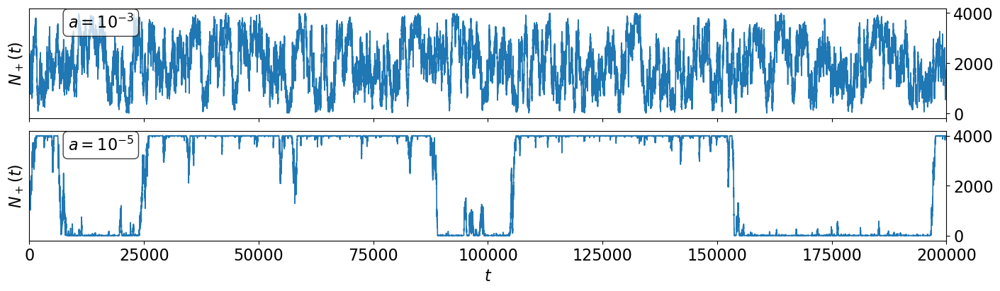

In [ ]:
plt.rcParams.update({'font.size': 16})
plot_two_traces(trace_high, 4000-trace_low, 1E-3, 1E-5)

### Main

In [ ]:
if __name__ == "__main__":
    dyn_cfg = DynConfig(
        num_realiz     = 200,
        sample_times   = log_schedule(200, 100000, 1.1),
        seed0          = np.array([167, 390], np.uint64),        #used only for the dynamics
        noise_values   = [1E-6,1E-5,1E-4,1E-3]
    )

    experiment = VoterExperiments(dyn_cfg, num_graphs=12)

    """
    results_safe = experiment.BA_sweep_m(
        N=4000,
        m_values=[2],
        base_seed=12025,
        checkpoint=True,              
        num_chunks=1,
        tag = 'noisy_BA_m2'               
    )
    """
    # try this with num_realiz = 200 and T_max = 100000
    results_long = experiment.SWSF_sweep_p(
        N=4000,
        p_values=[0.1],#.004,0.01],#0.02,0.04,0.1],#,0.0004,0.001,[0.002,0.004,0.01,0.05,0.1],
        base_seed=12025,                                         #used only for the structure
        checkpoint=True,       # this line makes it so the trajectories are saved and divided in chunks 
        num_chunks=1,
        tag = 'SSSF_m3_p1_noise_sweep_N4000'         
    )
    

[SSSF_m3_p1_noise_sweep_N4000] chunk 1/1 : 1 sweep_param values (elapsed 0:00:00)


In [ ]:
#try to find the critical noise level 

In [ ]:
#'SWSF_m3_p0till001_noise_sweep_N4000' p = 0.001 is not really there, also has one more noise level a = 1e-3
#'SWSF_m3_p001_002_noise_sweep_N4000'
#'SWSF_m3_p004_01_noise_sweep_N4000'   reintroduced a =1e-3 and removed a = 1e-7

In [ ]:
p_values=[0.0,0.0004]
sample_times   = log_schedule(200, 100000, 1.1)
noise_values   = [0.0,1E-7,1E-6,1E-5,1E-4]

In [ ]:
all_results_SSFvsRINGvsBA = []
all_filenames = []    # ← keep track of every filename we opened

for pattern in [
    "BA_m1234_chunk_*.pkl",
    "SW_m3_p_sweep_N4000_chunk_*.pkl",
    "SWFS_m3_p_sweep_N4000_chunk_*.pkl",
]:
    for fn in sorted(glob.glob(pattern)):
        all_filenames.append(fn)
        with open(fn, "rb") as f:
            all_results_SSFvsRINGvsBA.extend(pickle.load(f))

print(f"Loaded {len(all_results_SSFvsRINGvsBA)} tuples from {len(all_filenames)} files")

Loaded 240 tuples from 20 files


In [ ]:
all_results_SSF = []
all_filenames = []    # ← keep track of every filename we opened

for pattern in [
    "SWSF_m3_p0till001_noise_sweep_N4000_chunk_*.pkl",
    "SWSF_m3_p001_002_noise_sweep_N4000_chunk_*.pkl",
    "SWSF_m3_p004_01_noise_sweep_N4000_chunk_*.pkl",
]:
    for fn in sorted(glob.glob(pattern)):
        all_filenames.append(fn)
        with open(fn, "rb") as f:
            all_results_SSF.extend(pickle.load(f))

print(f"Loaded {len(all_results_SSF)} tuples from {len(all_filenames)} files")

Loaded 384 tuples from 6 files


In [ ]:
# load every chunk file that matches the pattern
chunk_files = sorted(glob.glob("noisy_BA_m2_chunk_*.pkl"))
resultsss = []
for fn in chunk_files:
    with open(fn, "rb") as f:
        resultsss.extend(pickle.load(f))

print(f"Loaded {len(resultsss)} tuples from {len(chunk_files)} files")

Loaded 48 tuples from 1 files


At this stage we already have the results of our experiment: an ensamble over graph realizations of time serieses of the dynamical average and variance of the order parameter, for different values of some sweep parameter 

### do we want the survival time of the metastable state?

## Plotting

#### imports

In [19]:
import matplotlib.pyplot as plt
from itertools import cycle
from graph_tool.all import graph_draw, sfdp_layout, random_layout

### functions

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import ceil, sqrt


def plot_noise_sweep_by_p(results,
                          sample_times,
                          p_values,
                          noise_values=None,
                          *,
                          dense0=None,
                          cmap_name="viridis",
                          figsize=(10, 4),      
                          sharey=True):
    """
    Disegna ⟨ρ(t)⟩ vs t per (p, noise) con:
      – p ∈ {0, 0.01}
      – legenda verticale nel primo pannello
      – etichette noise come potenze di dieci
    Resto dei parametri identico all’originale.
    """

    # ------------------------------------------------------------------
    # 0) quali p disegnare
    plotted_p = [p for p in p_values if p in (0, 0.01)]
    if not plotted_p:
        raise ValueError("Nessuno degli 'p_values' è 0 o 0.01.")
    
    # ------------------------------------------------------------------
    # 1) full time axis
    dense0 = dense0 or sample_times[0]
    times  = np.concatenate((np.arange(dense0), sample_times))

    # ------------------------------------------------------------------
    # 2) bucket the trajectories  →  data[p][noise] = [runs]
    if noise_values is None:
        noise_values = sorted({params['noise'] for _, params, _, _, _ in results})
    # escludi il noise bandito
    noise_values = [a for a in noise_values if not np.isclose(a, 1e-7)]
    data = {p: {a: [] for a in noise_values} for p in plotted_p}

    for _, params, _, avg_t, _ in results:
        p     = params['p']
        noise = params['noise']
        if p in data and noise in data[p]:
            data[p][noise].append(avg_t)

    # ------------------------------------------------------------------
    # 3) colori per i diversi noise
    cmap    = plt.get_cmap(cmap_name, len(noise_values))
    colours = [cmap(i) for i in range(len(noise_values))]

    # ------------------------------------------------------------------
    # 4) subplot grid fissa: 1×2
    n_p   = len(plotted_p)              # dovrebbe essere 2
    ncols = n_p
    nrows = 1
    fig, axes = plt.subplots(nrows, ncols,
                             figsize=figsize,
                             sharey=sharey, sharex=True,
                             squeeze=False)
    axes = axes.ravel()

    # ------------------------------------------------------------------
    # funzione per formattare le etichette noise
    def fmt_noise(a):
        if a!=0:
            exp = int(np.floor(np.log10(a)))
            coeff = a / 10**exp
            if np.isclose(coeff, 1):
                return rf"$a = 10^{{{exp}}}$"
            else:
                return rf"$a = {coeff:g}\times10^{{{exp}}}$"
        else: return rf"$a = 0$"

    # ------------------------------------------------------------------
    for k, (ax, p) in enumerate(zip(axes, plotted_p)):
        for j, noise in enumerate(noise_values):
            runs = data[p][noise]
            if not runs:
                continue

            mean_run = np.vstack(runs).mean(axis=0)
            ax.plot(times, mean_run,
                    lw=1.5, color=colours[j],
                    label=fmt_noise(noise), alpha=0.8)

        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_title(f"$p = {p}$")
        ax.set_xlim(1, 1E5)
        ax.set_ylim(1E-4, 0.9)
        ax.grid(False)

        # legenda solo sul primo subplot
        if k == 0:
            h, l = ax.get_legend_handles_labels()
            ax.legend(h, l, title=r"noise $a$",
                      loc="lower left",
                      frameon=True,
                      ncol=1)          # verticale

    # etichette assi ----------------------------------------------------
    for ax in axes:                       # entrambi, perché sharex=True
        ax.set_xlabel(r"time $t$ (sweeps)")
    axes[0].set_ylabel(r"$\langle \rho(t)\rangle$")

    plt.tight_layout()
    plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt


def plot_noise_sweep_BA(results,
                     sample_times,
                     noise_values=None,
                     *,
                     dense0=None,
                     cmap_name="viridis",
                     figsize=(6, 4)):
    """
    Disegna ⟨ρ(t)⟩ vs t per una rete BA con diversi livelli di rumore.

    Parameters
    ----------
    results : iterable
        (network_type, {'noise': …}, graph_id, trajectory, error)
    sample_times : 1-D array
        Punti di campionamento “non densi” della simulazione.
    noise_values : iterable, optional
        Valori di rumore da plottare (ordinati).  Se None vengono
        dedotti da *results* e ordinati.
    dense0 : int or None
        Durata della fase “densa” iniziale (in sweep).  Se None usa
        la prima voce di *sample_times*.
    cmap_name : str
        Qualsiasi colormap Matplotlib.
    figsize : tuple
        Dimensioni della figura.
    """

    # ------------------------------------------------------------------
    # 1) asse temporale completo
    dense0 = dense0 or sample_times[0]
    times  = np.concatenate((np.arange(dense0), sample_times))

    # ------------------------------------------------------------------
    # 2) raccogli le traiettorie  →  data[noise] = [runs]
    if noise_values is None:
        noise_values = sorted({params['noise'] for _, params, _, _, _ in results})

    # escludi il valore bandito
    noise_values = [a for a in noise_values]
    data = {a: [] for a in noise_values}

    for _, params, _, avg_t, _ in results:
        noise = params.get('noise')      # 'p' viene ignorato
        if noise in data:
            data[noise].append(avg_t)

    # ------------------------------------------------------------------
    # 3) colori
    cmap    = plt.get_cmap(cmap_name, len(noise_values))
    colours = [cmap(i) for i in range(len(noise_values))]

    # ------------------------------------------------------------------
    # 4) figura con asse singolo
    fig, ax = plt.subplots(figsize=figsize)

    def fmt_noise(a):
        if a == 0:
            return r"$a = 0$"
        exp = int(np.floor(np.log10(a)))
        coeff = a / 10**exp
        return rf"$a = {coeff:g}\times10^{{{exp}}}$" if not np.isclose(coeff, 1) \
               else rf"$a = 10^{{{exp}}}$"

    for j, noise in enumerate(noise_values):
        runs = data[noise]
        if not runs:
            continue
        mean_run = np.vstack(runs).mean(axis=0)
        ax.plot(times, mean_run,
                lw=1.5, color=colours[j],
                label=fmt_noise(noise), alpha=0.8)

    # log–log, limiti, griglia leggera
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlim(1, 1E5)
    #ax.set_ylim(1E-4, 0.9)
    ax.grid(False)

    # legenda verticale con riquadro
    ax.legend(title=r"noise $a$", loc="lower left",
              frameon=True, ncol=1)

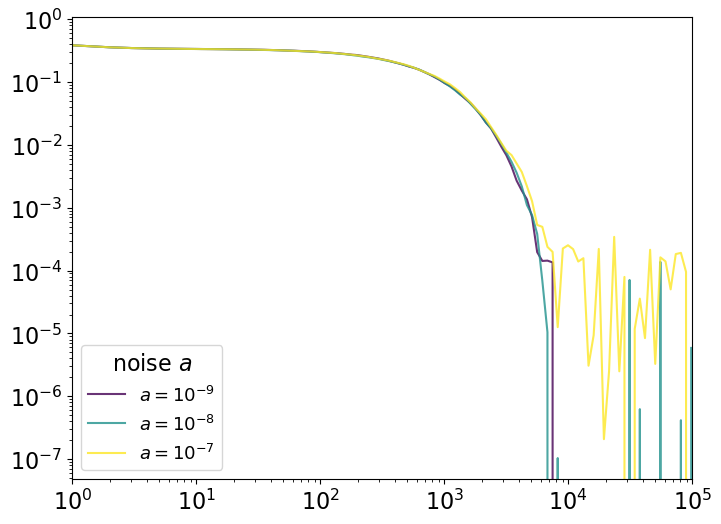

In [ ]:
plot_noise_sweep_BA(resultsss,           # your list of tuples
                      sample_times,         # array used in the sim
                      noise_values=[1E-9,1E-8,5E-8,1E-7],   # or whatever you like
                      figsize=(8, 6))

### to make sure finite size effects kick in even for p=0

In [120]:
def plot_SSF(resultsSSF,sample_times, p_values, 
                     *, dense0=None, cmap_name="viridis", figsize=(10,10)):
    # 1) full time axis
    dense0 = dense0 or sample_times[0]
    times  = np.concatenate((np.arange(dense0), sample_times))

    # 2) bucket by (m, noise) as before...
    data = {p: [] for p in p_values}
    for _, params, μ, avg_t, _ in resultsSSF:
        p = params["p"]; 
        data[p].append(avg_t)

    # 3) colors for each noise
    cmap = plt.get_cmap(cmap_name, len(p_values))
    colors = [cmap(i) for i in range(len(p_values))]

    # 4) set up subplots
    fig, axes = plt.subplots(1, 1, figsize=(figsize[0], figsize[1]),sharey=True)


    for i, p in enumerate(p_values):
            runs     = np.vstack(data[p])    # shape (num_graphs, L)
            mean_run = runs.mean(axis=0)
            line  = axes.plot(times, mean_run,
                               lw=1.5, color=colors[i],alpha = 0.5)
            
    #axes.set_title(f"m = {m}")
    axes.set_xscale("log")
    axes.set_yscale("log")
    axes.set_xlabel("time $t$ (sweeps)")
    axes.grid(False)

    axes.set_ylabel(r"$\langle \rho(t)\rangle$")

    # 6) one global legend, using only the first panel’s handles/labels
    fig.legend(
               #title="noise $a$",
               loc="upper center",
               ncol=1,
               frameon=False)

    plt.tight_layout(rect=[0,0,1,0.92])
    plt.show()

/tmp/ipykernel_2475/1560404300.py:36: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  fig.legend(


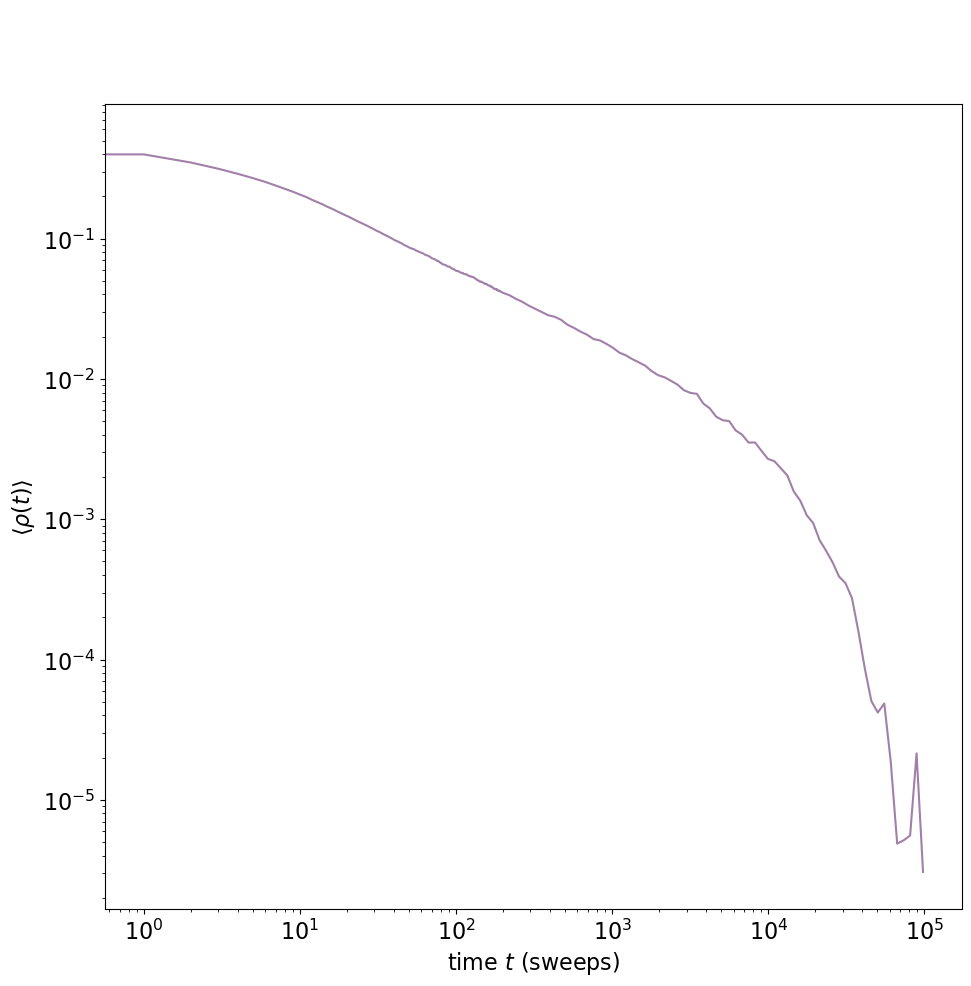

In [122]:
plot_SSF(resultsss,sample_times, p_values = [0])

### SW vs SWSF vs BA

In [ ]:
# load every chunk file that matches the pattern
chunk_files = sorted(glob.glob("BA_m1234_chunk_*.pkl"))
results_BA = []
for fn in chunk_files:
    with open(fn, "rb") as f:
        results_BA.extend(pickle.load(f))

print(f"Loaded {len(results_BA)} tuples from {len(chunk_files)} files")

# load every chunk file that matches the pattern
chunk_files = sorted(glob.glob("SW_m3_p_sweep_N4000_chunk_*.pkl"))
results_SW = []
for fn in chunk_files:
    with open(fn, "rb") as f:
        results_SW.extend(pickle.load(f))

print(f"Loaded {len(results_SW)} tuples from {len(chunk_files)} files")


results_SWSF = []
filenames = []    

for pattern in [
    "SWFS_m3_p_0_N4000_chunk_*.pkl",
    "SWFS_m3_p_sweep_N4000_chunk_*.pkl",

]:
    for fn in sorted(glob.glob(pattern)):
        filenames.append(fn)
        with open(fn, "rb") as f:
            results_SWSF.extend(pickle.load(f))

print(f"Loaded {len(results_SWSF)} tuples from {len(filenames)} files")

Loaded 36 tuples from 3 files
Loaded 108 tuples from 9 files
Loaded 108 tuples from 9 files


In [ ]:
def plot_p_sweep_and_BA(resultsSWSF, resultsSW, resultsBA,
                        sample_times, p_values, *,
                        dense0=None, cmap_name="viridis",
                        figsize=(14, 6)):
    # ---------------------------------------------------------------
    dense0 = dense0 or sample_times[0]
    times  = np.concatenate((np.arange(dense0), sample_times))

    cmap   = plt.get_cmap(cmap_name, len(p_values))
    colors = [cmap(i) for i in range(len(p_values))]

    # ---------------------------------------------------------------
    def _plot_one_dataset(ax, results):
        bucket = {p: [] for p in p_values}
        for _, params, μ, avg_t, _ in results:
            bucket[params["p"]].append(avg_t)

        handles = []
        for i, p in enumerate(p_values):
            runs = np.vstack(bucket[p])
            ax.plot(times, runs.T,
                    color=colors[i], alpha=0., lw=0.8, zorder=1)
            h, = ax.plot(times, runs.mean(0),
                         color=colors[i], alpha=0.9, lw=2,
                         label=f"p = {p:.4f}", zorder=30-i)   # top layer
            handles.append(h)
        return handles
    # ---------------------------------------------------------------

    fig, axes = plt.subplots(1, 2, figsize=figsize, sharey=True)

    h_p = _plot_one_dataset(axes[0], resultsSWSF)   # SWSF
    _   = _plot_one_dataset(axes[1], resultsSW)     # SW

    # ---------------------------------------------------------------
    m_values  = [1, 2, 3]
    data_BA   = {m: [] for m in m_values}
    for _, params, μ, avg_t, _ in resultsBA:
        data_BA[params["m"]].append(avg_t)

    ba_colors = ['#215584', '#24768b', '#44948f', '#6db290']
    h_ba = []
    for i, m in enumerate(m_values):
        if m == 2:          # omitted per your note
            continue
        runs = np.vstack(data_BA[m])
        for j, ax in enumerate(axes):
            ax.plot(times, runs.T,
                    color=ba_colors[i], alpha=0., lw=0.8, zorder=1)
            if m==1:
                line, = ax.plot(times, runs.mean(0),
                                color=ba_colors[i], alpha=0.9, lw=2,
                                label=f"m = {m} (BA)", zorder=100,linestyle = "--")  # under p-curves
            if m==3:
                                line, = ax.plot(times, runs.mean(0),
                                color='#f4a261', alpha=0.9, lw=2,
                                label=f"m = {m} (BA)", zorder=2)  # under p-curves

            if j == 0:      # store handle once for the legend
                h_ba.append(line)

    # ---------------------------------------------------------------
    for ax, title in zip(axes, ["SWSF", "SW"]):
        ax.set_xlim(1, 1e5)
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_xlabel("time $t$ (sweeps)")
        if title == "SWSF":
            ax.set_ylabel(r"$\langle\rho(t)\rangle$")
        ax.set_title(title)
        ax.grid(False)

    # Legend inside first panel, vertical
    axes[0].legend(h_p + h_ba,
                   [h.get_label() for h in h_p + h_ba],
                   loc="lower left", bbox_to_anchor=(0.05, 0.05),
                   frameon=True, ncol=1)

    fig.tight_layout()
    plt.show()


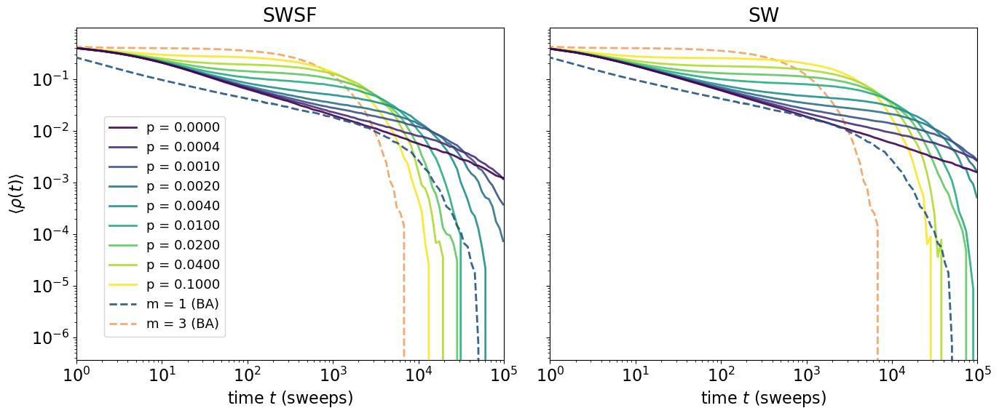

In [117]:
plt.rcParams.update({'font.size': 16})
plt.rcParams.update({'legend.fontsize': 13})
p_values=[0,0.0004,0.001,0.002,0.004,0.01,0.02,0.04,0.1]
sample_times   = log_schedule(200, 100000, 1.1)
plot_p_sweep_and_BA(results_SWSF,results_SW,results_BA ,sample_times, p_values,  cmap_name="viridis")

In [25]:
def plot_ba_sweep(results_m, sample_times, *,
                  dense0=None,
                  colors=None,
                  alpha_runs=0.25,
                  lw_runs=1.0,
                  lw_mean=2.0):
    """
    Overlay the ρ(t) curves for every BA-graph (light lines) and
    the mean over the 12 graphs (dark line) for each m.

    results_m   : list of tuples (model, params_dict, μ, avg_t, var_t)
    sample_times: 1-D array of ints
    """
    # 0) full time axis
    dense0 = dense0 or sample_times[0]
    times  = np.concatenate((np.arange(dense0), sample_times))

    # 1) extract and sort unique m values
    m_vals = sorted({ params['m'] for _, params, _, _, _ in results_m })

    # 2) group by each numeric m
    grouped = {m: [] for m in m_vals}
    for _, params, _, avg_t, _ in results_m:
        m = params['m']
        grouped[m].append(avg_t)

    # 3) prepare colors
    if colors is None:
        colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    col_cycle = cycle(colors)

    # 4) plot
    fig, ax = plt.subplots(figsize=(10,7))
    for m in m_vals:

        color = next(col_cycle)
        runs  = np.vstack(grouped[m])   # shape (12, L)
        # individual runs
        for run in runs:
            ax.plot(times, run,
                    color=color, linewidth=lw_runs, alpha=alpha_runs)
        # mean over the 12 graphs
        mean_run = runs.mean(axis=0)
        ax.plot(times, mean_run,
                color=color, linewidth=lw_mean, alpha=1.0,
                label=f"m = {m}")

    ax.set_xscale("log")
    ax.set_xlim(1,1e5)
    ax.set_yscale("log")
    ax.set_xlabel("time  $t$  (sweeps)")
    ax.set_ylabel(r"$\rho(t)$")
    ax.grid(False)
    ax.legend(title="BA parameter $m$")
    plt.tight_layout()
    plt.show()

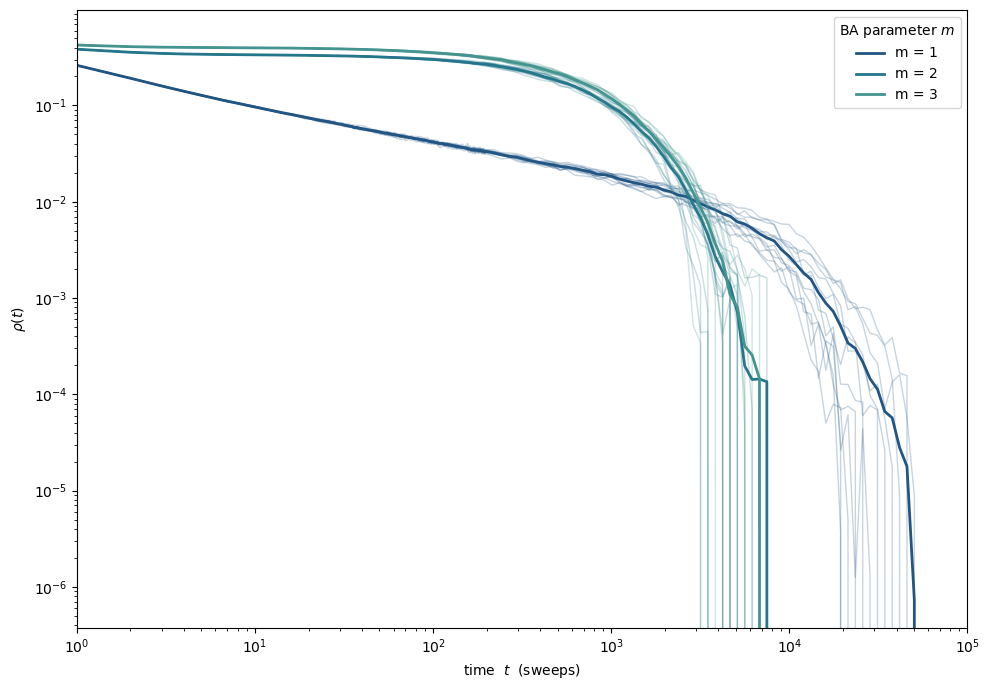

In [26]:
plot_ba_sweep(all_results,sample_times,colors=['#215584', '#24768b', '#44948f', '#6db290'])

## Graph plot

### some graph plots (useless)

In [45]:
m=3
N=1000
H = nx.watts_strogatz_graph(n=N, k=2*m, p=0., seed=788)
    #      ↑ k = numero totale di vicini (m a destra + m a sinistra)

    # 2) converti in graph-tool
G = gt.Graph(directed=False)
G.add_vertex(N)
G.add_edge_list(list(H.edges()))
pos = sfdp_layout(G)
H = nx.watts_strogatz_graph(n=N, k=2*m, p=0.2, seed=788)
    #      ↑ k = numero totale di vicini (m a destra + m a sinistra)

    # 2) converti in graph-tool
G = gt.Graph(directed=False)
G.add_vertex(N)
G.add_edge_list(list(H.edges()))

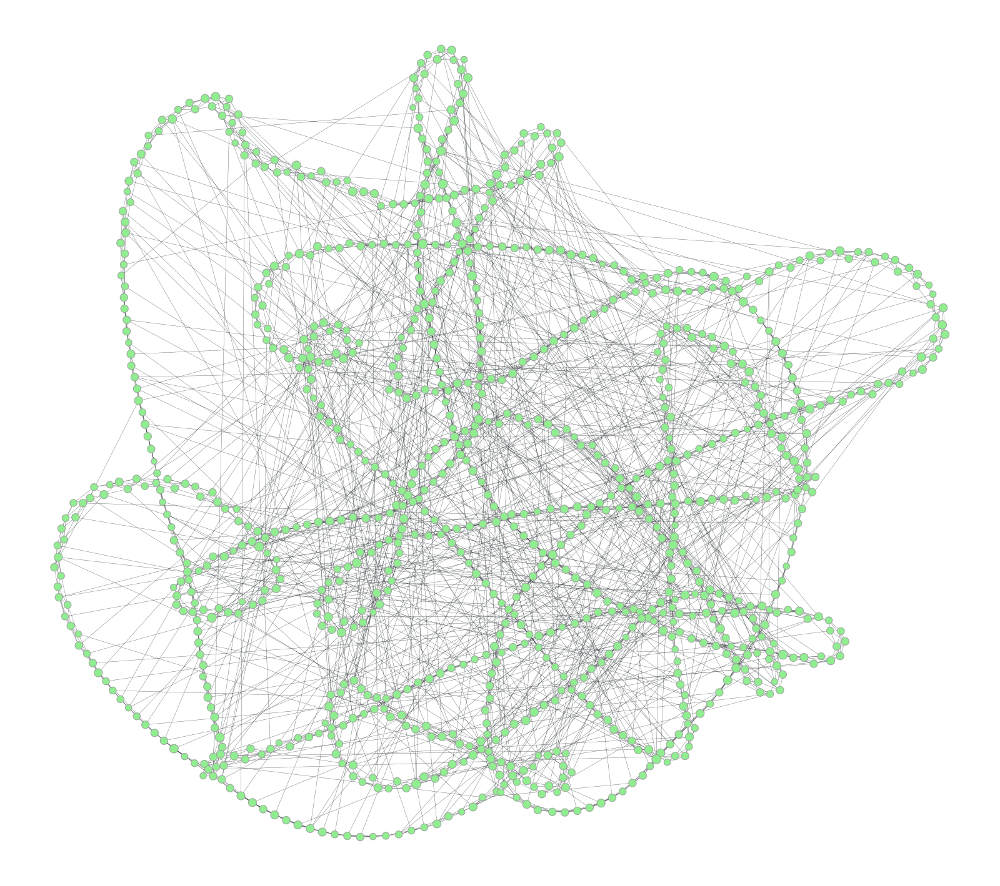

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7ff7fcde7b00, at 0x7ff7fc2bd2e0>

In [46]:
deg_map = G.degree_property_map("total")
size_map = G.new_vertex_property("float")
size_map.a = deg_map.a**(1/1.4) + 2.5

# 2. draw inline
graph_draw(
    G,
    pos                  = pos,
    vertex_size          = size_map,                  # tiny dots
    vertex_fill_color    = "lightgreen",
    #vertex_text          = G.vertex_index,    # use the built-in 0…N−1 labels
    #vertex_font_size     = 9,                 # pick a font size that fits
    #vertex_text_color    = "black",
    edge_pen_width       = 0.2,
    output_size          = (800, 1000),
    inline               = True,               # show in the notebook
    bg_color             = "white"  )              # transparent background

In [43]:

N=200
G = gt.circular_graph(N, k=3)
p=0.2
pos = sfdp_layout(G)

to_remove = []
for e in G.edges():              # e is an Edge object (descriptor)
    u = int(e.source())
    v = int(e.target())
    if abs(u - v) > 3:           # these are the wrap–around edges
        to_remove.append(e)

# 2) remove them one by one
for e in to_remove:
    G.remove_edge(e)

print(len(G.get_edges()))
        # collect forward edges in the _open_ lattice
to_rewire = []
for e in G.edges():
            u = int(e.source())
            v = int(e.target())
            d = v - u

            if 0 < d <= 3:
                to_rewire.append((u, v)) #this is a list of all allowed

print(len(to_rewire))

for u, v in to_rewire:
            if np.random.random() < p:  # THIS NEEDS THE SEEEEEEEDDDD
                # remove old
                G.remove_edge(G.edge(u, v))
                # pick new endpoint w ≠ u, not already connected to u
                forbidden = {u} | set(int(n) for n in G.get_in_neighbors(u))
                choices   = [w for w in range(N) if w not in forbidden]
                w = np.random.choice(choices)
                G.add_edge(u, w)

594
594


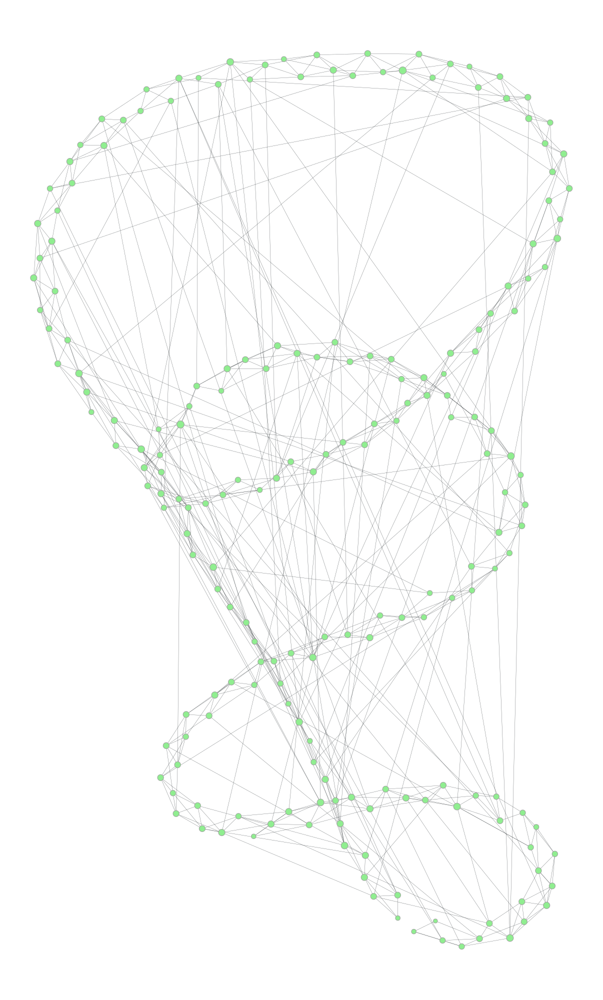

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7ff7fc0d1070, at 0x7ff7fc1f5bb0>

In [44]:
deg_map = G.degree_property_map("total")
size_map = G.new_vertex_property("float")
size_map.a = deg_map.a**(1/1.4) + 2.5
#pos = sfdp_layout(G)
# 2. draw inline
graph_draw(
    G,
    pos                  = pos,
    vertex_size          = size_map,                  # tiny dots
    vertex_fill_color    = "lightgreen",
    #vertex_text          = G.vertex_index,    # use the built-in 0…N−1 labels
    #vertex_font_size     = 9,                 # pick a font size that fits
    #vertex_text_color    = "black",
    edge_pen_width       = 0.2,
    output_size          = (800, 1000),
    inline               = True,               # show in the notebook
    bg_color             = "white"  )              # transparent background

In [32]:
m= 3
N=20000
a= m
G = gt.complete_graph(m) #the process starts with an m-clique
active_nodes = list(G.get_vertices())


for t in range(m,N):

        G.add_vertex()

        new_edges = [(t, j) for j in active_nodes]

        
        G.add_edge_list(new_edges)

        active_nodes.append(t)

        deactiv_weights = 1 / (a+G.get_total_degrees(active_nodes))
        deactiv_probs = deactiv_weights/deactiv_weights.sum()

        dactivated_node = np.random.choice(active_nodes,p=deactiv_probs)
        active_nodes.remove(dactivated_node)

rewire_prob = 0.9

E      = G.num_edges()     # whatever fraction you chose
n_iter = int(-0.5 * E * np.log(1-rewire_prob))
print(np.sum(G.get_total_degrees(G.get_vertices()))/N)
#pos = sfdp_layout(G)
#gt.random_rewire(G, model='configuration', edge_sweep=False, n_iter=n_iter)


5.9994


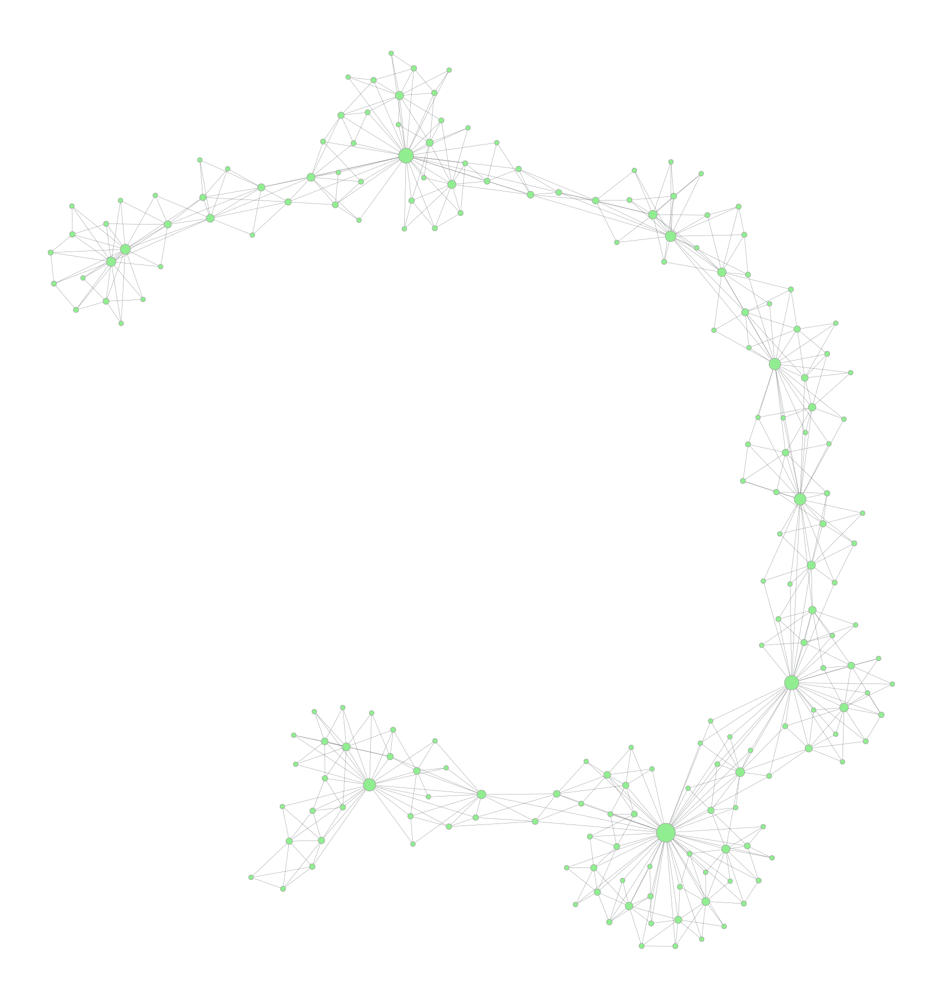

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f53375eed20, at 0x7f5345d430e0>

In [102]:
deg_map = G.degree_property_map("total")
size_map = G.new_vertex_property("float")
size_map.a = deg_map.a**(1/1.4) + 2.5
pos = sfdp_layout(G)
# 2. draw inline
graph_draw(
    G,
    pos                  = pos,
    vertex_size          = size_map,                  # tiny dots
    vertex_fill_color    = "lightgreen",
    #vertex_text          = G.vertex_index,    # use the built-in 0…N−1 labels
    #vertex_font_size     = 9,                 # pick a font size that fits
    #vertex_text_color    = "black",
    edge_pen_width       = 0.2,
    output_size          = (800, 1000),
    inline               = True,               # show in the notebook
    bg_color             = "white"  )              # transparent background

### plot comparison sf vs regular increasing disorder

In [31]:
N = 200
m=3
p_values =[ 0.01, 0.05, 0.5,0.98]
base_seed = 137

cfg0 = GraphConfig(N=N, model="SSF",
                            params={"m": int(m)},
                            graph_seed=base_seed)

g0 = make_graph(cfg0,2)

pos_sf = sfdp_layout(g0)

E = g0.num_edges() 
graphs_sf = []
graphs_sf.append(g0)

for prob in p_values:
        g = g0.copy()
        n_iter = int(-0.5 * E * np.log(1-prob)) 
        #correct number of swap trials (at least for SSF rewire) such that prob is a true rewire_p
        n_failed = gt.random_rewire(g, model="configuration", edge_sweep=False, n_iter=n_iter)
        graphs_sf.append(g)

In [ ]:
N = 400
m=1
p_values =[ 0.01, 0.05, 0.5,0.98]
base_seed = 137
cfg1 = GraphConfig(N=N, model="SW",
                            params={"m": int(m)},
                            graph_seed=base_seed)

g1 = make_graph(cfg1,2)

pos_reg = sfdp_layout(g1)

E = g1.num_edges() 
graphs_reg = []
graphs_reg.append(g1)

for prob in p_values:
        g = g1.copy()
        n_iter = int(-0.5 * E * np.log(1-prob)) 
        #correct number of swap trials (at least for SSF rewire) such that prob is a true rewire_p
        n_failed = gt.random_rewire(g, model="configuration", edge_sweep=False, n_iter=n_iter)
        graphs_reg.append(g)

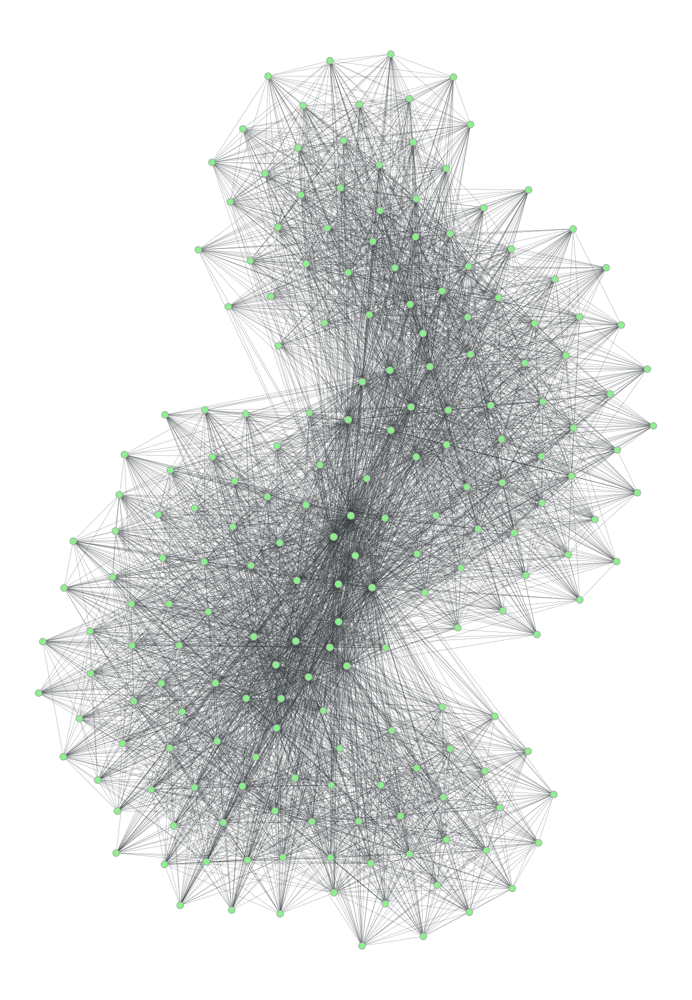

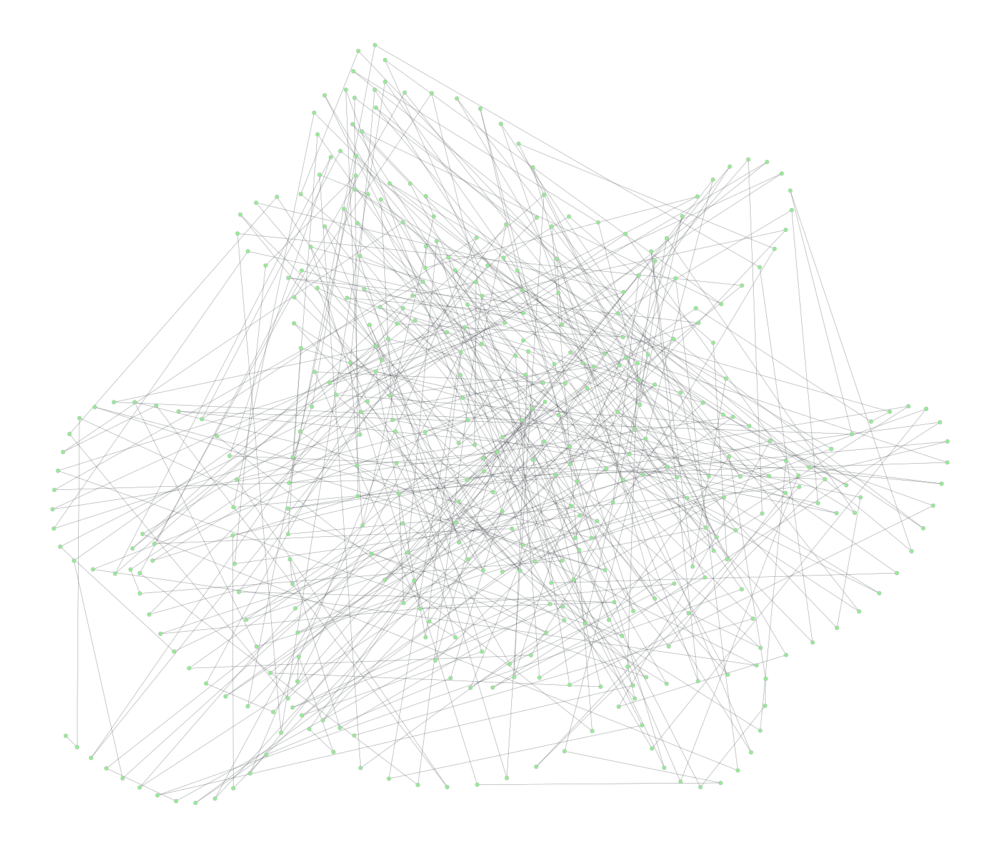

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x786a0a8a2120, at 0x786a0b7e2ea0>

In [272]:
Gsf = graphs_sf[0]
deg_map = Gsf.degree_property_map("total")
size_map = Gsf.new_vertex_property("float")
size_map.a = deg_map.a**(1/6) + 5

graph_draw(
    Gsf,
    pos                  = pos_sf,
    vertex_size          = size_map,                  # tiny dots
    vertex_fill_color    = "lightgreen",
    #vertex_text          = Gsf.vertex_index,    # use the built-in 0…N−1 labels
    #vertex_font_size     = 9,                 # pick a font size that fits
    #vertex_text_color    = "black",
    edge_pen_width       = 0.2,
    output_size          = (800, 1000),
    inline               = True,               # show in the notebook
    bg_color             = "white"  )              # transparent background

Greg = graphs_reg[4]
deg_map = Greg.degree_property_map("total")
size_map = Greg.new_vertex_property("float")
size_map.a = deg_map.a**(1/20) + 2

graph_draw(
    Greg,
    pos                  = pos_reg,
    vertex_size          = size_map,                  # tiny dots
    vertex_fill_color    = "lightgreen",
    #vertex_text          = Gsf.vertex_index,    # use the built-in 0…N−1 labels
    #vertex_font_size     = 9,                 # pick a font size that fits
    #vertex_text_color    = "black",
    edge_pen_width       = 0.2,
    output_size          = (800, 1000),
    inline               = True,               # show in the notebook
    bg_color             = "white"  )              # transparent background

In [27]:
N=870
m=3
H = nx.watts_strogatz_graph(n=N, k=2*m, p=0.2, seed=7788)
        #      ↑ k = numero totale di vicini (m a destra + m a sinistra)

        # 2) converti in graph-tool
G = gt.Graph(directed=False)
G.add_vertex(N)
G.add_edge_list(list(H.edges()))

g= cut_ring(G,N,m)

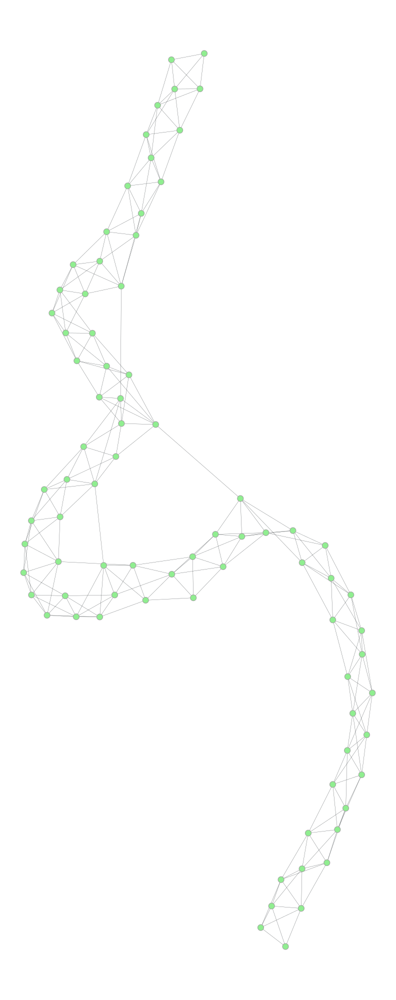

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7667c01d6870, at 0x7667a789a2a0>

In [20]:


graph_draw(
    G,
    #pos                  = pos_sf,
    vertex_size          = 6,                  # tiny dots
    vertex_fill_color    = "lightgreen",
    #vertex_text          = Gsf.vertex_index,    # use the built-in 0…N−1 labels
    #vertex_font_size     = 9,                 # pick a font size that fits
    #vertex_text_color    = "black",
    edge_pen_width       = 0.2,
    output_size          = (800, 1000),
    inline               = True,               # show in the notebook
    bg_color             = "white"  )              # transparent background